# Uso de DenseNet para la clasificación de neumonía viral y bacteriana con imágenes de Rayos X pediátricas

In [1]:
! pip install torchxrayvision
! pip install rxv
! pip install scikit-learn


In [2]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import numpy as np
import torchvision.transforms as transforms
import os


In [4]:
def extraer_categoria(nombre_archivo):
    if 'virus' in nombre_archivo:
        return 'viral'
    elif 'bacteria' in nombre_archivo:
        return 'bacteria'
    else:
        return 'normal'


In [5]:
def cargar_y_transformar_imagenes(ruta_carpeta):
    datos = []
    for archivo in os.listdir(ruta_carpeta):
        if archivo.endswith('.jpeg'):  # o el formato que tengas
            ruta_imagen = os.path.join(ruta_carpeta, archivo)
            imagen = Image.open(ruta_imagen)
            imagen_transformada = np.array(imagen)
            categoria = extraer_categoria(archivo)
            datos.append((imagen_transformada, categoria))
    return datos


In [6]:
ruta_1 = "TU_RUTA_A_TRAIN_PNEUMONIA"
train_neu = cargar_y_transformar_imagenes(ruta_1)
print(len(train_neu))

3883


In [7]:
ruta_2 = "TU_RUTA_A_TRAIN_NORMAL"
train_normal = cargar_y_transformar_imagenes(ruta_2)

In [8]:
ruta_3 = "TU_RUTA_A_TEST_PNEUMONIA"
test_neu = cargar_y_transformar_imagenes(ruta_3)

In [9]:
ruta_4 = "TU_RUTA_A_TEST_NORMAL"
test_normal = cargar_y_transformar_imagenes(ruta_4)

In [10]:
datos = train_neu + train_normal + test_neu + test_normal

In [11]:
def contar_categorias(datos):
    conteo_categorias = {}
    for _, categoria in datos:
        if categoria in conteo_categorias:
            conteo_categorias[categoria] += 1
        else:
            conteo_categorias[categoria] = 1

    total_datos = len(datos)
    proporciones = {categoria: conteo / total_datos for categoria, conteo in conteo_categorias.items()}

    return proporciones


In [12]:
proporciones_categorias = contar_categorias(datos)
print(proporciones_categorias)

{'bacteria': 0.47472677595628415, 'viral': 0.25495218579234974, 'normal': 0.2703210382513661}


## Comenzamos la separación entre train y test

In [13]:
from sklearn.model_selection import train_test_split

# Separar las imágenes de las etiquetas
imagenes, etiquetas = zip(*datos)

# Primera división: dividir en entrenamiento y temporal (test + val)
imagenes_train, imagenes_temp, etiquetas_train, etiquetas_temp = train_test_split(
    imagenes, etiquetas, test_size=0.3, stratify=etiquetas, random_state=42)

# Segunda división: dividir temporal en test y val
imagenes_test, imagenes_val, etiquetas_test, etiquetas_val = train_test_split(
    imagenes_temp, etiquetas_temp, test_size=0.5, stratify=etiquetas_temp, random_state=42)

# Convertir de nuevo a listas de tuplas
train_data = list(zip(imagenes_train, etiquetas_train))
test_data = list(zip(imagenes_test, etiquetas_test))
val_data = list(zip(imagenes_val, etiquetas_val))


In [22]:
proporciones_train = contar_categorias(train_data)
print(proporciones_train)
print(len(train_data))

{'viral': 0.25494022932422544, 'bacteria': 0.4747499390095145, 'normal': 0.27030983166626005}
4099


In [23]:
proporciones_test = contar_categorias(test_data)
print(proporciones_test)
print(len(test_data))

{'bacteria': 0.47494305239179957, 'viral': 0.255125284738041, 'normal': 0.26993166287015946}
878


In [24]:
proporciones_val = contar_categorias(val_data)
print(proporciones_val)
print(len(val_data))

{'bacteria': 0.47440273037542663, 'normal': 0.2707622298065984, 'viral': 0.25483503981797495}
879


## Preparamos las imágenes y el Dataset para su uso en el modelo

In [14]:
import torch
from torch.utils.data import DataLoader, Dataset
from torch.optim import Adam
from torch.nn import CrossEntropyLoss
import torchvision.models as models
import torch.nn as nn
import numpy as np
from sklearn.model_selection import StratifiedKFold

etiqueta_a_indice = {'normal': 0, 'bacteria': 1, 'viral': 2}

# Definir las transformaciones
from torchvision import transforms

# Asumiendo que tus imágenes están en escala de grises
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),  # Replicar el canal de grises
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])



from PIL import Image


class CustomDataset(Dataset):
    def __init__(self, datos, transform=None, etiqueta_a_indice=None):
        self.datos = datos
        self.transform = transform
        self.etiqueta_a_indice = etiqueta_a_indice if etiqueta_a_indice is not None else {}
        print(f"Longitud del dataset: {len(self.datos)}")  # Imprimir la longitud del dataset

    def __len__(self):
        return len(self.datos)

    def __getitem__(self, idx):
        if idx >= len(self.datos):
            raise IndexError(f"Índice {idx} está fuera de rango")  # Verificar la consistencia del índice

        print(f"Accediendo al índice: {idx}")  # Imprimir el índice accedido
        imagen, etiqueta = self.datos[idx]

        # Convertir la imagen a PIL Image si no lo es
        if not isinstance(imagen, Image.Image):
            imagen = Image.fromarray(imagen)

        # Aplicar la transformación
        if self.transform is not None:
            imagen = self.transform(imagen)

        # Convertir la etiqueta string a índice numérico
        etiqueta_num = self.etiqueta_a_indice.get(etiqueta, -1)  # Usar un valor por defecto si la etiqueta no está en el mapeo
        etiqueta_tensor = torch.tensor(etiqueta_num, dtype=torch.long)

        return imagen, etiqueta_tensor




train_dataset = CustomDataset(train_data, transform=transform, etiqueta_a_indice=etiqueta_a_indice)
test_dataset = CustomDataset(test_data, transform=transform, etiqueta_a_indice=etiqueta_a_indice)
val_dataset = CustomDataset(val_data, transform=transform, etiqueta_a_indice=etiqueta_a_indice)

# Separar las imágenes de las etiquetas para la estratificación
# Asumiendo que 'train_data' es una lista de tuplas (imagen, etiqueta)
_, etiquetas_train = zip(*train_data)
etiquetas_train = np.array(etiquetas_train)  # Convertir etiquetas a numpy array




Longitud del dataset: 4099
Longitud del dataset: 878
Longitud del dataset: 879


## Realizamos transfer learning con DenseNet

In [ ]:
# Cargar DenseNet121 preentrenado
# num_classes = 3  # Ajusta esto según tu número de clases
# backbone = CustomDenseNet(num_classes)
backbone = models.densenet121(pretrained=True)
num_features = backbone.classifier.in_features
backbone.classifier = nn.Linear(num_features, 3)

# Configurar dispositivo
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [15]:
print(device)

cuda:0


## Comenzamos con el entrenamiento del modelo

In [16]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score, confusion_matrix
from torch.utils.data import SubsetRandomSampler

# Número de splits para la validación cruzada
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Número de épocas para el entrenamiento
num_epochs = 15

# Almacenamiento de métricas de rendimiento para cada fold
rendimiento_folds = []

for fold, (train_idx, val_idx) in enumerate(skf.split(np.zeros(len(train_data)), etiquetas_train)):
    print(f"Comenzando fold {fold + 1}")

    # Preparar los conjuntos de datos de entrenamiento y validación para este fold
    train_subsampler = SubsetRandomSampler(train_idx)
    # val_subsampler = SubsetRandomSampler(val_idx)

    train_loader = DataLoader(train_dataset, batch_size=16, sampler=train_subsampler)
    # val_loader = DataLoader(val_dataset, batch_size=16, sampler=val_subsampler)

    # Reiniciar modelo y optimizador
    model = backbone.to(device)
    optimizer = Adam(model.parameters(), lr=0.0015, weight_decay=1e-4)
    criterion = CrossEntropyLoss()

    for epoch in range(num_epochs):
        # Entrenamiento
        model.train()
        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()


# torch.save(model.state_dict(), 'model_state.pth')


Comenzando fold 1
Accediendo al índice: 1314
Accediendo al índice: 241
Accediendo al índice: 198
Accediendo al índice: 2941
Accediendo al índice: 1544
Accediendo al índice: 2704
Accediendo al índice: 250
Accediendo al índice: 2894
Accediendo al índice: 2170
Accediendo al índice: 3954
Accediendo al índice: 460
Accediendo al índice: 3617
Accediendo al índice: 1766
Accediendo al índice: 3808
Accediendo al índice: 4061
Accediendo al índice: 1371
Accediendo al índice: 3854
Accediendo al índice: 1458
Accediendo al índice: 2706
Accediendo al índice: 1071
Accediendo al índice: 2384
Accediendo al índice: 3368
Accediendo al índice: 3767
Accediendo al índice: 1380
Accediendo al índice: 1098
Accediendo al índice: 1757
Accediendo al índice: 1009
Accediendo al índice: 2935
Accediendo al índice: 1169
Accediendo al índice: 351
Accediendo al índice: 1605
Accediendo al índice: 967
Accediendo al índice: 517
Accediendo al índice: 1908
Accediendo al índice: 3849
Accediendo al índice: 1468
Accediendo al índ

In [18]:

# Número de splits para la validación cruzada
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Número de épocas para el entrenamiento
num_epochs = 15

# Almacenamiento de métricas de rendimiento para cada fold
rendimiento_folds = []



for fold, (train_idx, val_idx) in enumerate(skf.split(np.zeros(len(val_data)), etiquetas_val)):
    print(f"Comenzando fold {fold + 1}")

    val_subsampler = SubsetRandomSampler(val_idx)
    val_loader = DataLoader(val_dataset, batch_size=16, sampler=val_subsampler)

    #val_loader = DataLoader(val_dataset, batch_size=16)

    # Reiniciar modelo y optimizador
    model = backbone.to(device)
    optimizer = Adam(model.parameters(), lr=0.0015, weight_decay=1e-4)
    criterion = CrossEntropyLoss()

    for epoch in range(num_epochs):
        # Validación
        model.eval()
        all_labels = []
        all_preds = []
        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.to(device)
                outputs = model(images)

                # Convertir las salidas del modelo a predicciones
                _, preds = torch.max(outputs, 1)

                # Acumular etiquetas y predicciones
                all_labels.extend(labels.cpu().numpy())
                all_preds.extend(preds.cpu().numpy())

        # Calcular métricas
        accuracy = accuracy_score(all_labels, all_preds)
        precision = precision_score(all_labels, all_preds, average='weighted')
        recall = recall_score(all_labels, all_preds, average='weighted')
        f1 = f1_score(all_labels, all_preds, average='weighted')
        conf_matrix = confusion_matrix(all_labels, all_preds)

        print(f'Fold {fold + 1}, Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}, Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}')

        # Almacenar métricas para este fold
        if epoch == num_epochs - 1:
            rendimiento_folds.append((accuracy, precision, recall, f1, conf_matrix))

# Al final, tendrás las métricas de rendimiento para cada fold
print("Rendimiento por Fold: ", rendimiento_folds)


Comenzando fold 1
Accediendo al índice: 825
Accediendo al índice: 160
Accediendo al índice: 765
Accediendo al índice: 115
Accediendo al índice: 744
Accediendo al índice: 642
Accediendo al índice: 725
Accediendo al índice: 273
Accediendo al índice: 780
Accediendo al índice: 369
Accediendo al índice: 131
Accediendo al índice: 38
Accediendo al índice: 56
Accediendo al índice: 729
Accediendo al índice: 646
Accediendo al índice: 254
Accediendo al índice: 760
Accediendo al índice: 652
Accediendo al índice: 862
Accediendo al índice: 711
Accediendo al índice: 19
Accediendo al índice: 181
Accediendo al índice: 479
Accediendo al índice: 275
Accediendo al índice: 268
Accediendo al índice: 213
Accediendo al índice: 789
Accediendo al índice: 69
Accediendo al índice: 567
Accediendo al índice: 129
Accediendo al índice: 306
Accediendo al índice: 287
Accediendo al índice: 659
Accediendo al índice: 52
Accediendo al índice: 139
Accediendo al índice: 153
Accediendo al índice: 94
Accediendo al índice: 812


## Visualizamos los resultados de nuestro modelo

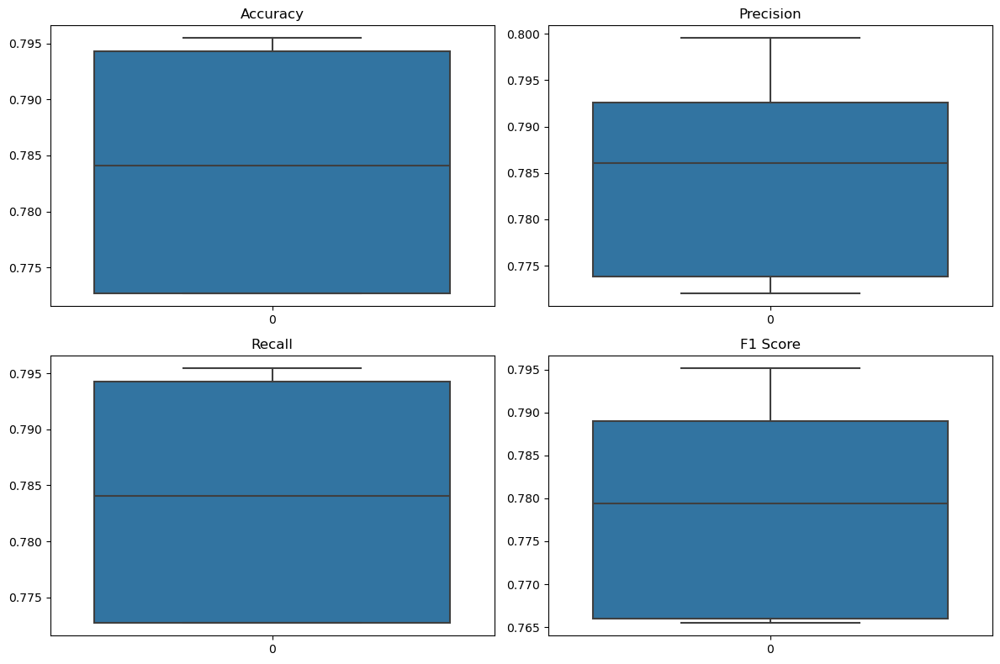

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Suponiendo que 'rendimiento_folds' contiene las métricas de todos los folds
# Ejemplo: [(acc1, prec1, rec1, f11, cm1), (acc2, prec2, rec2, f12, cm2), ...]

# Extraer cada métrica en listas separadas
accuracies = [fold[0] for fold in rendimiento_folds]
precisions = [fold[1] for fold in rendimiento_folds]
recalls = [fold[2] for fold in rendimiento_folds]
f1_scores = [fold[3] for fold in rendimiento_folds]

# Crear gráficos de caja y brazos
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
sns.boxplot(data=accuracies)
plt.title('Accuracy')

plt.subplot(2, 2, 2)
sns.boxplot(data=precisions)
plt.title('Precision')

plt.subplot(2, 2, 3)
sns.boxplot(data=recalls)
plt.title('Recall')

plt.subplot(2, 2, 4)
sns.boxplot(data=f1_scores)
plt.title('F1 Score')

plt.tight_layout()
plt.show()


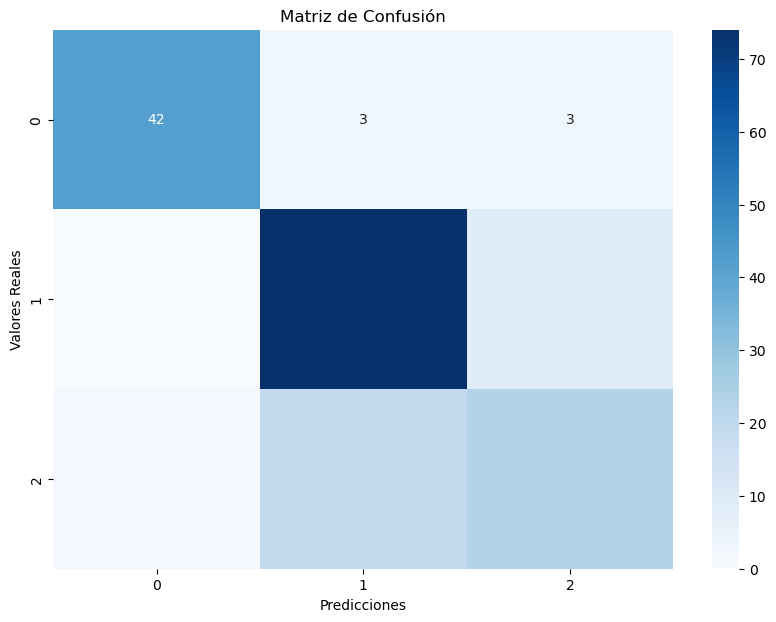

In [20]:
conf_matrix = rendimiento_folds[-1][4]

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues')
plt.title('Matriz de Confusión')
plt.xlabel('Predicciones')
plt.ylabel('Valores Reales')
plt.show()

In [21]:
# Asegúrate de que tu modelo está en modo de evaluación
model.eval()
# model = TheModelClass(*args, **kwargs)  # Reemplaza con la clase de tu modelo y argumentos necesarios
# model.load_state_dict(torch.load('model_state.pth'))
# model.eval()  # No olvides poner tu modelo en modo de evaluación

test_loader = DataLoader(test_dataset, batch_size=16)

# Variables para almacenar las predicciones y las etiquetas verdaderas
all_labels = []
all_preds = []

# Desactivar el cálculo de gradientes
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        # Obtener las predicciones del modelo
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        # Acumular las etiquetas y predicciones
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

# Calcular las métricas
accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='weighted')
recall = recall_score(all_labels, all_preds, average='weighted')
f1 = f1_score(all_labels, all_preds, average='weighted')
conf_matrix = confusion_matrix(all_labels, all_preds)

# Imprimir las métricas
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')
print(f'Matriz de Confusión:\n{conf_matrix}')


Accediendo al índice: 0
Accediendo al índice: 1
Accediendo al índice: 2
Accediendo al índice: 3
Accediendo al índice: 4
Accediendo al índice: 5
Accediendo al índice: 6
Accediendo al índice: 7
Accediendo al índice: 8
Accediendo al índice: 9
Accediendo al índice: 10
Accediendo al índice: 11
Accediendo al índice: 12
Accediendo al índice: 13
Accediendo al índice: 14
Accediendo al índice: 15
Accediendo al índice: 16
Accediendo al índice: 17
Accediendo al índice: 18
Accediendo al índice: 19
Accediendo al índice: 20
Accediendo al índice: 21
Accediendo al índice: 22
Accediendo al índice: 23
Accediendo al índice: 24
Accediendo al índice: 25
Accediendo al índice: 26
Accediendo al índice: 27
Accediendo al índice: 28
Accediendo al índice: 29
Accediendo al índice: 30
Accediendo al índice: 31
Accediendo al índice: 32
Accediendo al índice: 33
Accediendo al índice: 34
Accediendo al índice: 35
Accediendo al índice: 36
Accediendo al índice: 37
Accediendo al índice: 38
Accediendo al índice: 39
Accediendo

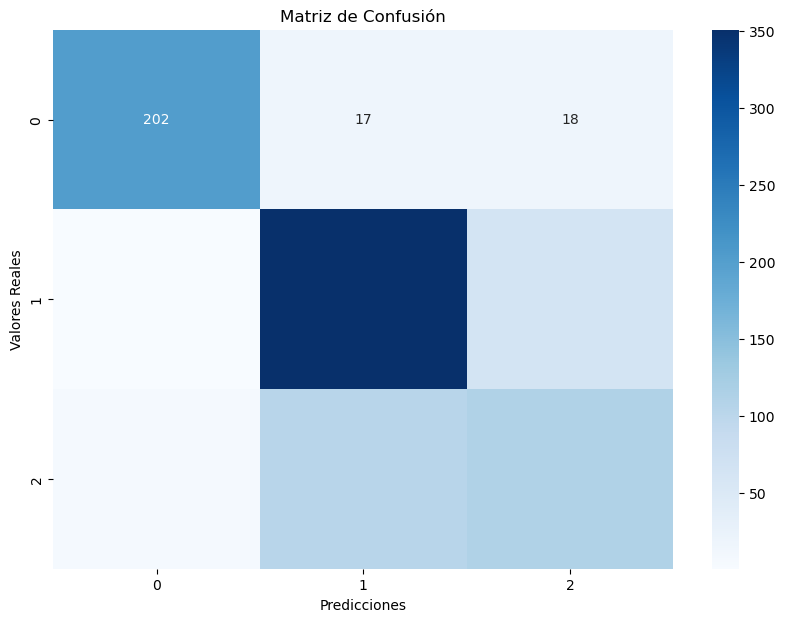

In [22]:
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues')
plt.title('Matriz de Confusión')
plt.xlabel('Predicciones')
plt.ylabel('Valores Reales')
plt.show()